In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision import models
import numpy as np
from tqdm import tqdm

# DeepLabV3+ Encoder with ASPP and Atrous Convolutions
class DeepLabV3PlusEncoder(nn.Module):
    def __init__(self, in_channels=3):
        super(DeepLabV3PlusEncoder, self).__init__()

        # Using a pretrained ResNet backbone for DeepLabV3+
        resnet = models.resnet50(pretrained=True)
        self.layer1 = nn.Sequential(*list(resnet.children())[:5])   # Output stride 4
        self.layer2 = resnet.layer2   # Output stride 8
        self.layer3 = resnet.layer3   # Output stride 16
        self.layer4 = resnet.layer4   # Output stride 32

        # ASPP (Atrous Spatial Pyramid Pooling)
        self.aspp = ASPP(in_channels=2048, out_channels=256)

    def forward(self, x):
        # Pass through the ResNet backbone
        x = self.layer1(x)
        low_level_features = x  # Capture low-level features for decoder
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        # Apply ASPP to the high-level features
        x = self.aspp(x)
        return x, low_level_features

# ASPP Module (Atrous Spatial Pyramid Pooling)
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels=256):
        super(ASPP, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.conv3_1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=6, padding=6)
        self.conv3_2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=12, padding=12)
        self.conv3_3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=18, padding=18)
        self.project = nn.Conv2d(out_channels * 4, out_channels, kernel_size=1)

    def forward(self, x):
        x1 = F.relu(self.conv1(x))
        x2 = F.relu(self.conv3_1(x))
        x3 = F.relu(self.conv3_2(x))
        x4 = F.relu(self.conv3_3(x))
        x = torch.cat([x1, x2, x3, x4], dim=1)
        return self.project(x)

# Diffusion Model Block
class DiffusionBlock(nn.Module):
    def __init__(self, in_channels, timesteps=10):
        super(DiffusionBlock, self).__init__()
        self.timesteps = timesteps
        self.noise_scale = nn.Parameter(torch.tensor(0.1))
        self.denoise_layers = nn.ModuleList([nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1) for _ in range(timesteps)])

    def forward(self, x):
        # Forward diffusion process
        noisy_x = x + self.noise_scale * torch.randn_like(x)

        # Reverse diffusion process with denoising steps
        for t in range(self.timesteps):
            noisy_x = F.relu(self.denoise_layers[t](noisy_x))
        return noisy_x

# DeepLabV3+ Decoder with just Upsampling
class DeepLabV3PlusDecoder(nn.Module):
    def __init__(self, num_classes, low_level_channels=256, aspp_channels=256):
        super(DeepLabV3PlusDecoder, self).__init__()
        self.low_level_conv = nn.Conv2d(low_level_channels, 48, kernel_size=1)
        self.final_conv = nn.Conv2d(aspp_channels + 48, num_classes, kernel_size=1)

    def forward(self, x, low_level_features):
        low_level_features = self.low_level_conv(low_level_features)
        # Upsample the high-level features to match the low-level feature resolution
        x = F.interpolate(x, size=low_level_features.shape[2:], mode="bilinear", align_corners=False)
        # Concatenate the features from the ASPP (encoder) and low-level features
        x = torch.cat([x, low_level_features], dim=1)
        x = self.final_conv(x)
        return x

# Full DeepLabV3+ Model with Diffusion Block
class DeepLabV3PlusWithDiffusion(nn.Module):
    def __init__(self, num_classes=21, timesteps=10):
        super(DeepLabV3PlusWithDiffusion, self).__init__()
        self.encoder = DeepLabV3PlusEncoder()
        self.diffusion_block = DiffusionBlock(in_channels=256, timesteps=timesteps)
        self.decoder = DeepLabV3PlusDecoder(num_classes)

    def forward(self, x):
        # Pass through the encoder (ResNet + ASPP)
        x, low_level_features = self.encoder(x)
        # Pass through the diffusion block to refine features
        x = self.diffusion_block(x)
        # Pass through the decoder (upsample and final convolution)
        x = self.decoder(x, low_level_features)
        return x

# Instantiate and test
model = DeepLabV3PlusWithDiffusion(num_classes=21)
sample_input = torch.randn(1, 3, 512, 512)  # Example input
output = model(sample_input)
print(output.shape)  # Expected output shape: [1, num_classes, 512, 512]

# Load Dataset (Pascal VOC 2012 for example)
def get_voc_data(batch_size=4):
    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # Resize images to 512x512
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Standard normalization for pretrained models
    ])
    target_transform = transforms.Compose([
        transforms.Resize((512, 512),
        transforms.ToTensor())
    ])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 131MB/s]


torch.Size([1, 21, 128, 128])


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from tqdm import tqdm

# Load Dataset (Pascal VOC 2012 for example)
def get_voc_data(batch_size=4):
    # Transformation for input images (resize, convert to tensor, normalize)
    input_transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize images to 512x512
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Standard normalization for pretrained models
    ])

    # Transformation for target segmentation masks (only resize and convert to tensor)
    target_transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize masks to 512x512
        transforms.ToTensor()  # Convert the target mask to a tensor (1-channel)
    ])

    # Pascal VOC dataset with segmentation masks
    train_dataset = datasets.VOCSegmentation(
        root="./data", year="2012", image_set="train", download=True, transform=input_transform, target_transform=target_transform
    )

    val_dataset = datasets.VOCSegmentation(
        root="./data", year="2012", image_set="val", download=True, transform=input_transform, target_transform=target_transform
    )

    # DataLoader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader

# Accuracy calculation
def calculate_accuracy(preds, targets, num_classes=21):
    preds = torch.argmax(preds, dim=1)  # Get the predicted class for each pixel
    correct = (preds == targets).sum().item()  # Count correct pixels
    total = targets.numel()  # Total number of pixels
    return correct / total  # Pixel accuracy

# Training and evaluation loop
def train_and_evaluate(model, train_loader, val_loader, num_epochs=3, lr=1e-4):
    # Loss function and optimizer
    criterion = nn.CrossEntropyLoss()  # CrossEntropyLoss expects targets as long integers
    optimizer = optim.Adam(model.parameters(), lr=lr)

    model.train()  # Set the model to training mode

    for epoch in range(num_epochs):
        train_loss = 0.0
        train_accuracy = 0.0

        # Training loop
        for images, targets in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            optimizer.zero_grad()

            # Ensure targets are of type long (integer class labels)
            targets = targets.squeeze(1).long()  # Remove the extra channel (1-channel) and convert to long

            # Forward pass
            outputs = model(images)

            # Upsample the output to match the target size (512x512)
            outputs = nn.functional.interpolate(outputs, size=targets.shape[1:], mode="bilinear", align_corners=True)

            # Compute the loss
            loss = criterion(outputs, targets)  # CrossEntropyLoss automatically applies softmax
            loss.backward()
            optimizer.step()

            # Calculate accuracy
            accuracy = calculate_accuracy(outputs, targets)
            train_loss += loss.item()
            train_accuracy += accuracy

        # Average loss and accuracy for this epoch
        train_loss /= len(train_loader)
        train_accuracy /= len(train_loader)

        print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")

        # Evaluation loop
        model.eval()  # Set the model to evaluation mode
        val_accuracy = 0.0
        with torch.no_grad():
            for images, targets in val_loader:
                # Ensure targets are of type long (integer class labels)
                targets = targets.squeeze(1).long()  # Remove the extra channel (1-channel) and convert to long

                # Forward pass
                outputs = model(images)

                # Upsample the output to match the target size (512x512)
                outputs = nn.functional.interpolate(outputs, size=targets.shape[1:], mode="bilinear", align_corners=True)

                # Calculate accuracy
                accuracy = calculate_accuracy(outputs, targets)
                val_accuracy += accuracy

        val_accuracy /= len(val_loader)
        print(f"Validation Accuracy: {val_accuracy:.4f}")

# Instantiate the model
model = DeepLabV3PlusWithDiffusion(num_classes=21)

# Prepare data loaders
train_loader, val_loader = get_voc_data(batch_size=4)

# Train and evaluate the model
train_and_evaluate(model, train_loader, val_loader, num_epochs=3, lr=1e-4)


Using downloaded and verified file: ./data/VOCtrainval_11-May-2012.tar
Extracting ./data/VOCtrainval_11-May-2012.tar to ./data
Using downloaded and verified file: ./data/VOCtrainval_11-May-2012.tar
Extracting ./data/VOCtrainval_11-May-2012.tar to ./data


Epoch 1/3: 100%|██████████| 366/366 [29:31<00:00,  4.84s/it]


Train Loss: 0.3334, Train Accuracy: 0.9392
Validation Accuracy: 0.9448


Epoch 2/3: 100%|██████████| 366/366 [28:30<00:00,  4.67s/it]


Train Loss: 0.1943, Train Accuracy: 0.9451
Validation Accuracy: 0.9448


Epoch 3/3: 100%|██████████| 366/366 [29:12<00:00,  4.79s/it]


Train Loss: 0.1856, Train Accuracy: 0.9450
Validation Accuracy: 0.9448


In [6]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from tqdm import tqdm

# Load the Pascal VOC validation dataset (to use as a test set)
def get_voc_test_data(batch_size=4):
    # Transformation for input images (resize, convert to tensor, normalize)
    input_transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize images to 256x256
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Standard normalization
    ])

    # Transformation for target segmentation masks (resize and convert to tensor)
    target_transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize masks to 256x256
        transforms.ToTensor()  # Convert the target mask to a tensor (1-channel)
    ])

    # Pascal VOC dataset for testing (using validation set as the test set)
    test_dataset = datasets.VOCSegmentation(
        root="./data", year="2012", image_set="val", download=True, transform=input_transform, target_transform=target_transform
    )

    # DataLoader for the test dataset
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return test_loader

# Test the model on Pascal VOC "test" set (using val set)
def test_model(model, test_loader):
    model.eval()  # Set the model to evaluation mode
    test_accuracy = 0.0
    num_samples = 0

    # Iterate through the test dataset
    with torch.no_grad():
        for images, targets in tqdm(test_loader, desc="Testing"):
            targets = targets.squeeze(1).long()  # Remove the extra channel (1-channel) and convert to long

            # Forward pass
            outputs = model(images)

            # Upsample the output to match the target size (256x256)
            outputs = nn.functional.interpolate(outputs, size=targets.shape[1:], mode="bilinear", align_corners=True)

            # Calculate accuracy
            accuracy = calculate_accuracy(outputs, targets)
            test_accuracy += accuracy
            num_samples += 1

    # Average accuracy across the test set
    test_accuracy /= num_samples
    print(f"Test Accuracy: {test_accuracy:.4f}")


model = DeepLabV3PlusWithDiffusion(num_classes=21)
# Load the test data
test_loader = get_voc_test_data(batch_size=4)

# Test the model
test_model(model, test_loader)


Using downloaded and verified file: ./data/VOCtrainval_11-May-2012.tar
Extracting ./data/VOCtrainval_11-May-2012.tar to ./data


Testing: 100%|██████████| 363/363 [08:45<00:00,  1.45s/it]

Test Accuracy: 0.0268


Using downloaded and verified file: ./data/VOCtrainval_11-May-2012.tar
Extracting ./data/VOCtrainval_11-May-2012.tar to ./data


Testing: 100%|██████████| 363/363 [09:25<00:00,  1.56s/it]
<ipython-input-10-d5ca598793d7>:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap("tab20", num_classes)  # Using tab20 color map for visualization


Overall Pixel Accuracy: 0.0003
Overall Mean IoU: 0.0004


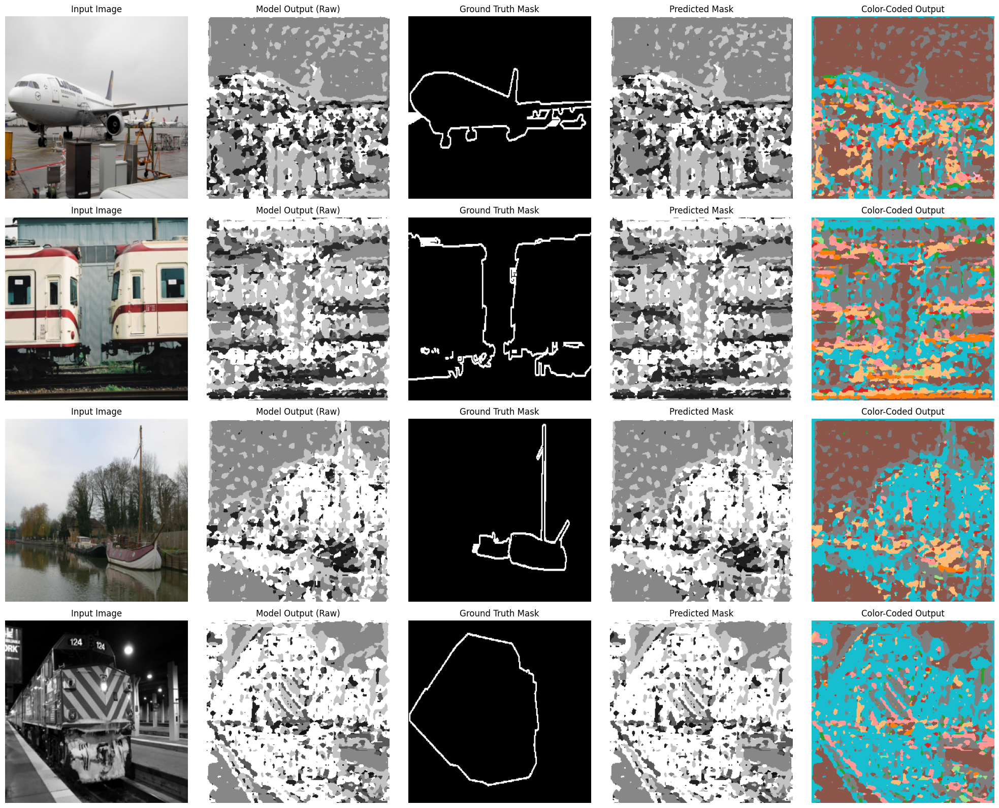

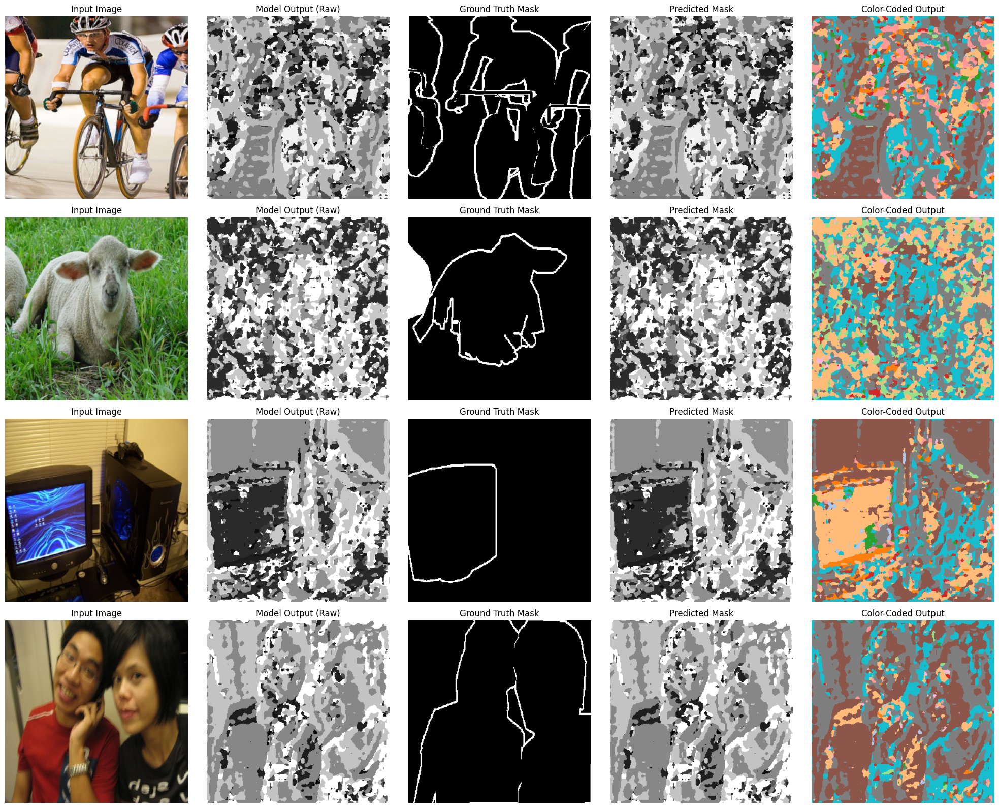

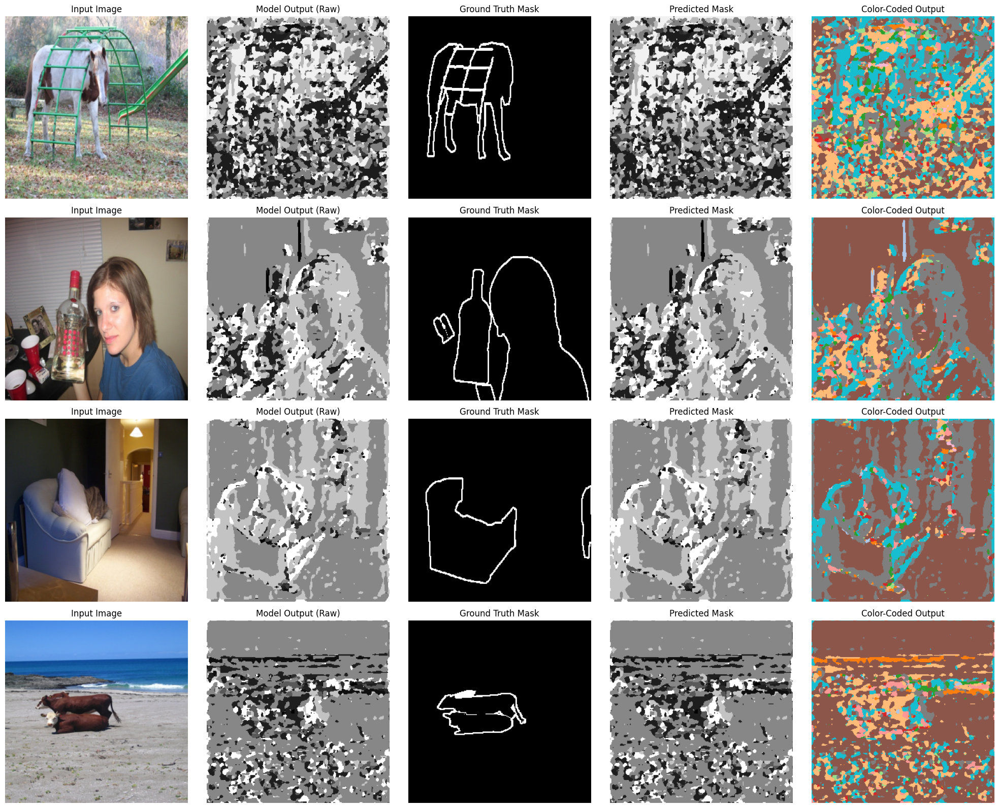

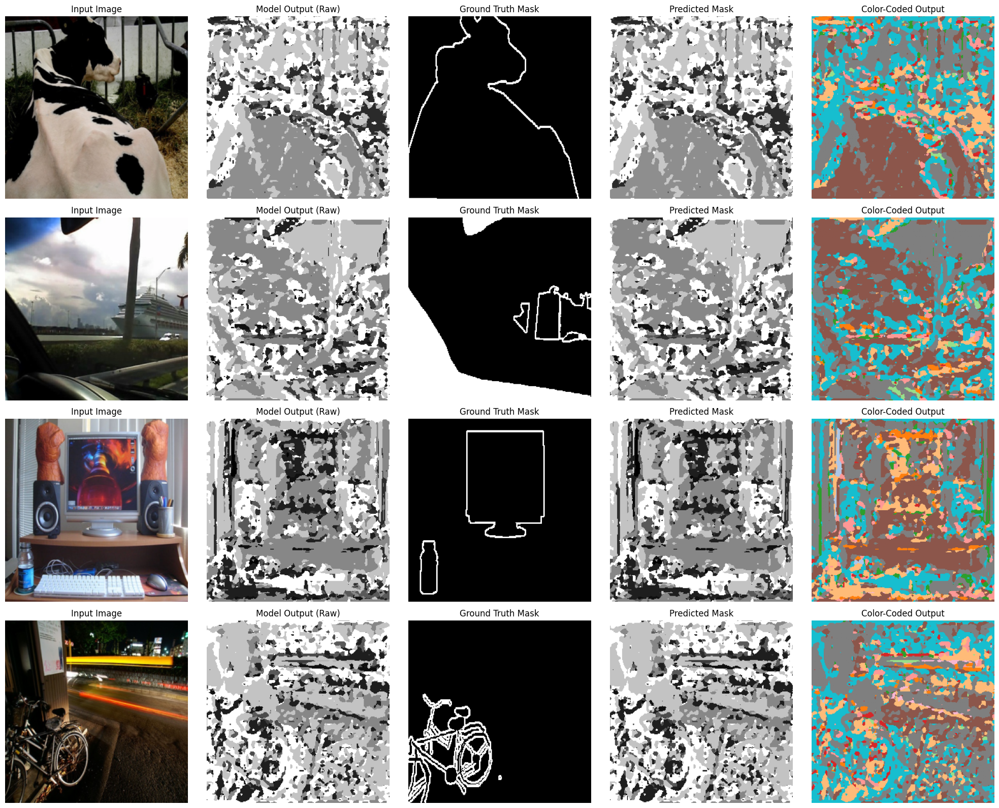

In [10]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from tqdm import tqdm

# Load Pascal VOC validation dataset (using it as a test set)
def get_voc_test_data(batch_size=4):
    input_transform = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize images to 256x256
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    target_transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()
    ])
    test_dataset = datasets.VOCSegmentation(
        root="./data", year="2012", image_set="val", download=True, transform=input_transform, target_transform=target_transform
    )
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    return test_loader

# Function to visualize inputs, predictions, and final output
def visualize_predictions(images, targets, model_outputs, predictions, num_images=4, num_classes=21):
    # Unnormalize images
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    images = images * std + mean  # Unnormalize

    # Define a color map for classes
    color_map = plt.cm.get_cmap("tab20", num_classes)  # Using tab20 color map for visualization

    fig, axs = plt.subplots(num_images, 5, figsize=(20, num_images * 4))
    for i in range(num_images):
        # Input Image
        axs[i, 0].imshow(images[i].permute(1, 2, 0).cpu())  # Input image
        axs[i, 0].set_title("Input Image")
        axs[i, 0].axis("off")

        # Raw Model Output (probabilities for each class)
        axs[i, 1].imshow(model_outputs[i].argmax(0).cpu(), cmap='gray')
        axs[i, 1].set_title("Model Output (Raw)")
        axs[i, 1].axis("off")

        # Ground Truth Mask
        axs[i, 2].imshow(targets[i].cpu(), cmap='gray')  # Ground truth mask
        axs[i, 2].set_title("Ground Truth Mask")
        axs[i, 2].axis("off")

        # Predicted Mask
        axs[i, 3].imshow(predictions[i].cpu(), cmap='gray')  # Predicted mask
        axs[i, 3].set_title("Predicted Mask")
        axs[i, 3].axis("off")

        # Color-coded Output
        color_pred = color_map(predictions[i].cpu() / num_classes)  # Scale to [0, 1] for color map
        axs[i, 4].imshow(color_pred)
        axs[i, 4].set_title("Color-Coded Output")
        axs[i, 4].axis("off")

    plt.tight_layout()
    plt.show()

# Test model and visualize predictions
def test_and_visualize_model(model, test_loader, num_images_to_display=4):
    model.eval()
    total_pixel_accuracy = 0.0
    total_mean_iou = 0.0
    num_samples = 0
    images_to_display = []

    with torch.no_grad():
        for images, targets in tqdm(test_loader, desc="Testing"):
            targets = targets.squeeze(1).long()  # Convert to long and remove extra channel

            # Forward pass
            outputs = model(images)
            outputs = nn.functional.interpolate(outputs, size=targets.shape[1:], mode="bilinear", align_corners=True)

            # Predicted classes
            preds = torch.argmax(outputs, dim=1)

            # Accumulate pixel accuracy and mean IoU
            pixel_accuracy, mean_iou = calculate_metrics(outputs, targets)
            total_pixel_accuracy += pixel_accuracy
            total_mean_iou += mean_iou
            num_samples += 1

            # Store images for visualization
            if len(images_to_display) < num_images_to_display:
                images_to_display.append((images.cpu(), targets.cpu(), outputs.cpu(), preds.cpu()))

        # Average metrics across the test set
        avg_pixel_accuracy = total_pixel_accuracy / num_samples
        avg_mean_iou = total_mean_iou / num_samples
        print(f"Overall Pixel Accuracy: {avg_pixel_accuracy:.4f}")
        print(f"Overall Mean IoU: {avg_mean_iou:.4f}")

    # Display a few images with predictions and color-coded outputs
    for img, target, model_output, pred in images_to_display:
        visualize_predictions(img, target, model_output, pred, num_images=min(len(img), num_images_to_display))

# Instantiate your model here
model = DeepLabV3PlusWithDiffusion(num_classes=21)  # Ensure this matches your model setup

# Load test data
test_loader = get_voc_test_data(batch_size=4)

# Test and visualize model performance
test_and_visualize_model(model, test_loader, num_images_to_display=4)
